# Binnig Effect on Modelling 

In [127]:
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt 
import seaborn as sns 

from sklearn.model_selection import train_test_split # data splitting
from sklearn.linear_model import LogisticRegression # model Logistic Reg
from sklearn.tree import plot_tree

from sklearn.metrics import mean_squared_error # cek MSE
from sklearn.metrics import accuracy_score # cek accuracy score

from sklearn.preprocessing import KBinsDiscretizer # untuk binning
from sklearn.feature_selection import SelectPercentile # feature selection

In [5]:
disk = pd.read_csv('disk.csv')
disk.head()

,x,class
0,51,0
1,19,1
2,66,1
3,35,0
4,64,1


In [7]:
disk['class'].value_counts()/disk.shape[0]*100

1    51.863963
0    48.136037
Name: class, dtype: float64

In [11]:
disk['x eqintv'] = pd.cut(disk['x'],7)
disk['x eqintv encode'] = pd.cut(disk['x'],7, labels=range(1,8))

disk

,x,class,x eqintv,x eqintv encode
0,51,0,"(46.0, 53.0]",5
1,19,1,"(17.951, 25.0]",1
2,66,1,"(60.0, 67.0]",7
3,35,0,"(32.0, 39.0]",3
4,64,1,"(60.0, 67.0]",7
...,...,...,...,...
1524,58,1,"(53.0, 60.0]",6
1525,64,1,"(60.0, 67.0]",7
1526,47,0,"(46.0, 53.0]",5
1527,26,1,"(25.0, 32.0]",2


In [12]:
# melihat proporsi category (di sini 0 dan 1) pada setiap interval

pd.crosstab(disk['x eqintv'], disk['class'], normalize=0)

class,0,1
x eqintv,,
"(17.951, 25.0]",0.224670,0.775330
"(25.0, 32.0]",0.537037,0.462963
"(32.0, 39.0]",0.835616,0.164384
"(39.0, 46.0]",0.846561,0.153439
"(46.0, 53.0]",0.583673,0.416327
"(53.0, 60.0]",0.302632,0.697368
"(60.0, 67.0]",0.068293,0.931707


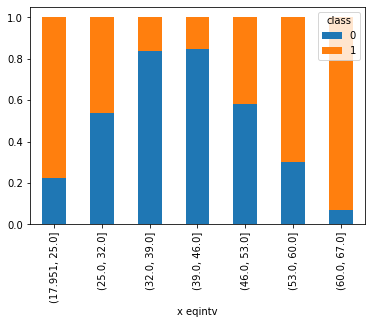

In [13]:
# visualisasi proporsi category/class pada setiap interval

pd.crosstab(disk['x eqintv'], disk['class'], normalize=0).plot(kind='bar', stacked=True)

## Kesimpulan Grafik di atas

- kalau melihat data keseluruhan proporsinya hampir 50:50
- tapi setelah dikelompokkan berdasarkan interval, terlihat distibusinya tidak normal

### Model 1: tanpa Binning

In [15]:
X = disk[['x']]
y = disk[['class']]

# split data
X_train, X_test, y_train, y_test = train_test_split(X,y, stratify=y, random_state=2020)

# pakai startify karena targetnya berupa categorical

In [17]:
# fitting data 
logreg = LogisticRegression()
logreg.fit(X_train, y_train)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [19]:
# predict data test
y_pred = logreg.predict(X_test)
print('Accuracy:', accuracy_score(y_test, y_pred))

Accuracy: 0.5822454308093995


### Model 2: dengan Binning

In [28]:
discretize = KBinsDiscretizer(n_bins=7, encode='onehot', strategy='uniform')
discretize.fit(X_train)
X_train_disc = discretize.transform(X_train)
X_test_disc = discretize.transform(X_test)


In [29]:
print(X_train_disc)

  (0, 0)	1.0
  (1, 1)	1.0
  (2, 5)	1.0
  (3, 3)	1.0
  (4, 6)	1.0
  (5, 6)	1.0
  (6, 6)	1.0
  (7, 5)	1.0
  (8, 4)	1.0
  (9, 1)	1.0
  (10, 6)	1.0
  (11, 5)	1.0
  (12, 2)	1.0
  (13, 6)	1.0
  (14, 3)	1.0
  (15, 0)	1.0
  (16, 1)	1.0
  (17, 4)	1.0
  (18, 1)	1.0
  (19, 6)	1.0
  (20, 5)	1.0
  (21, 5)	1.0
  (22, 2)	1.0
  (23, 6)	1.0
  (24, 5)	1.0
  :	:
  (1121, 1)	1.0
  (1122, 5)	1.0
  (1123, 5)	1.0
  (1124, 1)	1.0
  (1125, 5)	1.0
  (1126, 2)	1.0
  (1127, 0)	1.0
  (1128, 6)	1.0
  (1129, 3)	1.0
  (1130, 6)	1.0
  (1131, 2)	1.0
  (1132, 5)	1.0
  (1133, 5)	1.0
  (1134, 4)	1.0
  (1135, 2)	1.0
  (1136, 5)	1.0
  (1137, 0)	1.0
  (1138, 0)	1.0
  (1139, 6)	1.0
  (1140, 5)	1.0
  (1141, 4)	1.0
  (1142, 2)	1.0
  (1143, 3)	1.0
  (1144, 0)	1.0
  (1145, 2)	1.0


In [30]:
# fitting data train yg sudah di-discretize

# logreg = LogisticRegression()
logreg.fit(X_train_disc, y_train)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [31]:
# predict data test yg sudah di-discretize

y_pred_disc = logreg.predict(X_test_disc)
print('Accuracy with binning:', accuracy_score(y_pred_disc, y_test))

Accuracy with binning: 0.6997389033942559


### akurasi meningkat dari 58% jadi 69%. Jadi binning tentu dapat meningkatkan performance dari model.

# Apply Several Preprocessing Method to Modeling at Once 
    Part 2

    1. Data
    2. EDA
    3. Missing Value
    4. Preprocessing
    5. Data Splitting
    6. Data Trasformation
    7. Model fitting
    8. Model propertief

## Data: Adult Dataset

In [33]:
df_adult = pd.read_csv('adult.csv')
df_adult.head()

,age,workclass,fnlwgt,education,education.num,marital.status,occupation,relationship,race,sex,capital.gain,capital.loss,hours.per.week,native.country,income
0,90,?,77053,HS-grad,9,Widowed,?,Not-in-family,White,Female,0,4356,40,United-States,<=50K
1,82,Private,132870,HS-grad,9,Widowed,Exec-managerial,Not-in-family,White,Female,0,4356,18,United-States,<=50K
2,66,?,186061,Some-college,10,Widowed,?,Unmarried,Black,Female,0,4356,40,United-States,<=50K
3,54,Private,140359,7th-8th,4,Divorced,Machine-op-inspct,Unmarried,White,Female,0,3900,40,United-States,<=50K
4,41,Private,264663,Some-college,10,Separated,Prof-specialty,Own-child,White,Female,0,3900,40,United-States,<=50K


data target berupa incomee

In [34]:
df_adult.describe()

,age,fnlwgt,education.num,capital.gain,capital.loss,hours.per.week
count,32561.000000,3.256100e+04,32561.000000,32561.000000,32561.000000,32561.000000
mean,38.581647,1.897784e+05,10.080679,1077.648844,87.303830,40.437456
std,13.640433,1.055500e+05,2.572720,7385.292085,402.960219,12.347429
min,17.000000,1.228500e+04,1.000000,0.000000,0.000000,1.000000
25%,28.000000,1.178270e+05,9.000000,0.000000,0.000000,40.000000
50%,37.000000,1.783560e+05,10.000000,0.000000,0.000000,40.000000
75%,48.000000,2.370510e+05,12.000000,0.000000,0.000000,45.000000
max,90.000000,1.484705e+06,16.000000,99999.000000,4356.000000,99.000000


In [35]:
df_adult.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32561 entries, 0 to 32560
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   age             32561 non-null  int64 
 1   workclass       32561 non-null  object
 2   fnlwgt          32561 non-null  int64 
 3   education       32561 non-null  object
 4   education.num   32561 non-null  int64 
 5   marital.status  32561 non-null  object
 6   occupation      32561 non-null  object
 7   relationship    32561 non-null  object
 8   race            32561 non-null  object
 9   sex             32561 non-null  object
 10  capital.gain    32561 non-null  int64 
 11  capital.loss    32561 non-null  int64 
 12  hours.per.week  32561 non-null  int64 
 13  native.country  32561 non-null  object
 14  income          32561 non-null  object
dtypes: int64(6), object(9)
memory usage: 3.7+ MB


# Missing Value

- tidak ada NaN
- ganti ? jadi np.nan
-

In [37]:
# repalce ? dengan np.nan
df_adult = df_adult.replace('?', np.nan)

In [38]:
# lihat proporsi
df_adult.isnull().sum()/df_adult.shape[0]*100

# ada nan di feature yg tidak 0

age               0.000000
workclass         5.638647
fnlwgt            0.000000
education         0.000000
education.num     0.000000
marital.status    0.000000
occupation        5.660146
relationship      0.000000
race              0.000000
sex               0.000000
capital.gain      0.000000
capital.loss      0.000000
hours.per.week    0.000000
native.country    1.790486
income            0.000000
dtype: float64

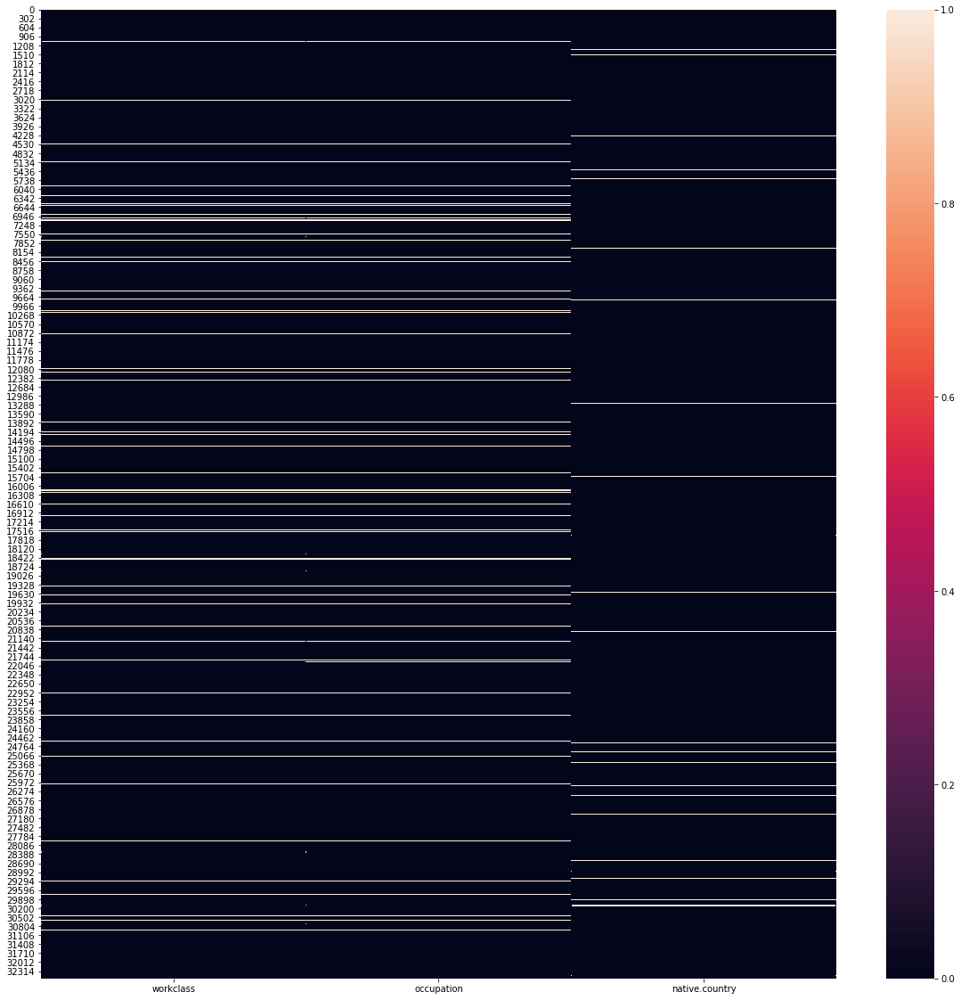

In [40]:
# plt.figure(figsize=(20,20))
# sns.heatmap(df_adult[['workclass','occupation','native.country']].isnull())

### yg garis putih adalah nan, ketika di workclass ada nan, biasanya di occupation ada nan juga 

# Preprocessing

In [41]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.impute import SimpleImputer

from sklearn.pipeline import Pipeline

import category_encoders as ce
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer

In [89]:
# describe categorical feature

categorical_features = df_adult.columns[df_adult.dtypes == object]
df_adult[categorical_features].describe()

,workclass,education,marital.status,occupation,relationship,race,sex,native.country,income
count,30725,32561,32561,30718,32561,32561,32561,31978,32561
unique,8,16,7,14,6,5,2,41,2
top,Private,HS-grad,Married-civ-spouse,Prof-specialty,Husband,White,Male,United-States,<=50K
freq,22696,10501,14976,4140,13193,27816,21790,29170,24720


preprocess scheme:

* one hot encoding : relationship, race, sex
* binary encoding : workclass, marital status, occupation, native country  
* ordinal encoding : education (already encoded)
* no treatment : size
out: fnlwgt


In [90]:
# preprocessing secara sequential/urutan dengan pipeline
# pertama, imputer dulu, baru pipeline
binary_encoder_pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy='constant', fill_value='NS')),
    ('binary encoder', ce.BinaryEncoder())
])

# transformer (mengubah kolom-kolom dengan method/transformer berbeda)
transformer = ColumnTransformer([
    ('one hot encoder', OneHotEncoder(drop='first'),['relationship','race','sex']),
    ('binary encoder', binary_encoder_pipeline,['workclass','marital.status','occupation','native.country']) # di sini ada 2 step yg terjadi (lihat pipeline)
], remainder='passthrough')

# drop 'first': mencegah multicollinearity

# Data Splitting

In [91]:
X = df_adult.drop(columns = ['fnlwgt','income','education'])
y = np.where(df_adult['income']=='>50K', 1, 0)

In [92]:
X_train, X_test, y_train, y_test = train_test_split(X,y, random_state=10)

In [93]:
X_train.head()

,age,workclass,education.num,marital.status,occupation,relationship,race,sex,capital.gain,capital.loss,hours.per.week,native.country
29849,20,Private,10,Never-married,Adm-clerical,Own-child,White,Female,0,0,10,United-States
30319,20,Private,9,Never-married,Farming-fishing,Not-in-family,White,Male,0,0,55,United-States
1878,47,State-gov,16,Married-civ-spouse,Prof-specialty,Husband,White,Male,15024,0,50,United-States
20686,50,Self-emp-not-inc,10,Divorced,Exec-managerial,Unmarried,Asian-Pac-Islander,Female,0,0,40,NaN
26007,39,Private,10,Never-married,Machine-op-inspct,Other-relative,Asian-Pac-Islander,Male,0,0,40,Philippines


# Data Transformation

In [94]:
# X_train dilakukan fit dan transform
X_train_prep = transformer.fit_transform(X_train)

# X_test hanya ditransform
X_test_prep = transformer.transform(X_test)

In [95]:
X_train_prep # masih array

array([[0.0000e+00, 0.0000e+00, 1.0000e+00, ..., 0.0000e+00, 0.0000e+00,
        1.0000e+01],
       [1.0000e+00, 0.0000e+00, 0.0000e+00, ..., 0.0000e+00, 0.0000e+00,
        5.5000e+01],
       [0.0000e+00, 0.0000e+00, 0.0000e+00, ..., 1.5024e+04, 0.0000e+00,
        5.0000e+01],
       ...,
       [0.0000e+00, 0.0000e+00, 1.0000e+00, ..., 0.0000e+00, 0.0000e+00,
        4.0000e+01],
       [0.0000e+00, 0.0000e+00, 0.0000e+00, ..., 0.0000e+00, 0.0000e+00,
        4.0000e+01],
       [0.0000e+00, 0.0000e+00, 0.0000e+00, ..., 0.0000e+00, 0.0000e+00,
        4.0000e+01]])

In [96]:
#  ubah jadi dataframe
X_train_prep = pd.DataFrame(X_train_prep)
X_test_prep = pd.DataFrame(X_test_prep) 

In [97]:
X_train_prep

,0,1,2,3,4,5,6,7,8,9,...,26,27,28,29,30,31,32,33,34,35
0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,1.0,20.0,10.0,0.0,0.0,10.0
1,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,...,0.0,0.0,0.0,0.0,1.0,20.0,9.0,0.0,0.0,55.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,...,0.0,0.0,0.0,0.0,1.0,47.0,16.0,15024.0,0.0,50.0
3,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,50.0,10.0,0.0,0.0,40.0
4,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,1.0,1.0,39.0,10.0,0.0,0.0,40.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24415,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,31.0,10.0,0.0,0.0,35.0
24416,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,1.0,1.0,23.0,12.0,0.0,0.0,16.0
24417,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,...,0.0,0.0,0.0,0.0,1.0,38.0,11.0,0.0,0.0,40.0
24418,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,...,0.0,0.0,0.0,0.0,1.0,47.0,9.0,0.0,0.0,40.0


In [98]:
transformer.transformers_

[('one hot encoder',
  OneHotEncoder(categories='auto', drop='first', dtype=<class 'numpy.float64'>,
                handle_unknown='error', sparse=True),
  ['relationship', 'race', 'sex']),
 ('binary encoder',
  Pipeline(memory=None,
           steps=[('imputer',
                   SimpleImputer(add_indicator=False, copy=True, fill_value='NS',
                                 missing_values=nan, strategy='constant',
                                 verbose=0)),
                  ('binary encoder',
                   BinaryEncoder(cols=None, drop_invariant=False,
                                 handle_missing='value', handle_unknown='value',
                                 mapping=None, return_df=True, verbose=0))],
           verbose=False),
  ['workclass', 'marital.status', 'occupation', 'native.country']),
 ('remainder', 'passthrough', [0, 2, 8, 9, 10])]

In [99]:
X_train.head()

,age,workclass,education.num,marital.status,occupation,relationship,race,sex,capital.gain,capital.loss,hours.per.week,native.country
29849,20,Private,10,Never-married,Adm-clerical,Own-child,White,Female,0,0,10,United-States
30319,20,Private,9,Never-married,Farming-fishing,Not-in-family,White,Male,0,0,55,United-States
1878,47,State-gov,16,Married-civ-spouse,Prof-specialty,Husband,White,Male,15024,0,50,United-States
20686,50,Self-emp-not-inc,10,Divorced,Exec-managerial,Unmarried,Asian-Pac-Islander,Female,0,0,40,NaN
26007,39,Private,10,Never-married,Machine-op-inspct,Other-relative,Asian-Pac-Islander,Male,0,0,40,Philippines


In [100]:
# ambil nama features yg menggunakan transformer OneHot Encoder
feature_onehot = transformer.transformers_[0][1].get_feature_names()
feature_onehot

array(['x0_Not-in-family', 'x0_Other-relative', 'x0_Own-child',
       'x0_Unmarried', 'x0_Wife', 'x1_Asian-Pac-Islander', 'x1_Black',
       'x1_Other', 'x1_White', 'x2_Male'], dtype=object)

In [101]:
# ambil nama features yg menggunakan transformer Binary Encoder 
feature_binary = transformer.transformers_[1][1][1].get_feature_names()
feature_binary

['0_0',
 '0_1',
 '0_2',
 '0_3',
 '0_4',
 '1_0',
 '1_1',
 '1_2',
 '1_3',
 '2_0',
 '2_1',
 '2_2',
 '2_3',
 '2_4',
 '3_0',
 '3_1',
 '3_2',
 '3_3',
 '3_4',
 '3_5',
 '3_6']

In [102]:
X_train.iloc[:, [0, 2, 8, 9, 10]].head(2)
# ini columns yg tidak diencoding (passthrough)

,age,education.num,capital.gain,capital.loss,hours.per.week
29849,20,10,0,0,10
30319,20,9,0,0,55


In [103]:
# menggabungkan nama-nama features

features = list(feature_onehot) + list(feature_binary) + ['age','education.num','capital.gain','capital.loss','hours.per.week']

In [104]:
# masukkan nama kolom/feature ke dlam dataframe

X_train_prep.columns = features
X_test_prep.columns = features

In [105]:
X_train_prep

,x0_Not-in-family,x0_Other-relative,x0_Own-child,x0_Unmarried,x0_Wife,x1_Asian-Pac-Islander,x1_Black,x1_Other,x1_White,x2_Male,...,3_2,3_3,3_4,3_5,3_6,age,education.num,capital.gain,capital.loss,hours.per.week
0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,1.0,20.0,10.0,0.0,0.0,10.0
1,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,...,0.0,0.0,0.0,0.0,1.0,20.0,9.0,0.0,0.0,55.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,...,0.0,0.0,0.0,0.0,1.0,47.0,16.0,15024.0,0.0,50.0
3,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,50.0,10.0,0.0,0.0,40.0
4,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,1.0,1.0,39.0,10.0,0.0,0.0,40.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24415,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,31.0,10.0,0.0,0.0,35.0
24416,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,1.0,1.0,23.0,12.0,0.0,0.0,16.0
24417,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,...,0.0,0.0,0.0,0.0,1.0,38.0,11.0,0.0,0.0,40.0
24418,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,...,0.0,0.0,0.0,0.0,1.0,47.0,9.0,0.0,0.0,40.0


In [106]:
X_train_prep.columns

Index(['x0_Not-in-family', 'x0_Other-relative', 'x0_Own-child', 'x0_Unmarried',
       'x0_Wife', 'x1_Asian-Pac-Islander', 'x1_Black', 'x1_Other', 'x1_White',
       'x2_Male', '0_0', '0_1', '0_2', '0_3', '0_4', '1_0', '1_1', '1_2',
       '1_3', '2_0', '2_1', '2_2', '2_3', '2_4', '3_0', '3_1', '3_2', '3_3',
       '3_4', '3_5', '3_6', 'age', 'education.num', 'capital.gain',
       'capital.loss', 'hours.per.week'],
      dtype='object')

# Model Fitting and Evaluation

In [107]:
#  buat model
model = DecisionTreeClassifier(max_depth=3)
model.fit(X_train_prep, y_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=3, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

In [109]:
y_predict = model.predict(X_test_prep)
print('Accuracy:', accuracy_score(y_test, y_predict))

Accuracy: 0.8355238914138312


# Model Properties

In [111]:
importance_table = pd.DataFrame({
    'importance':model.feature_importances_
}, index = features)

importance_table

,importance
x0_Not-in-family,0.000000
x0_Other-relative,0.000000
x0_Own-child,0.000000
x0_Unmarried,0.000000
x0_Wife,0.000000
x1_Asian-Pac-Islander,0.000000
x1_Black,0.000000
x1_Other,0.000000
x1_White,0.000000
x2_Male,0.000000


In [113]:
importance_table.loc[importance_table['importance']!=0]
# fetures yg memiliki importance (tidak 0)

,importance
1_3,0.472094
age,0.002291
education.num,0.261116
capital.gain,0.264498


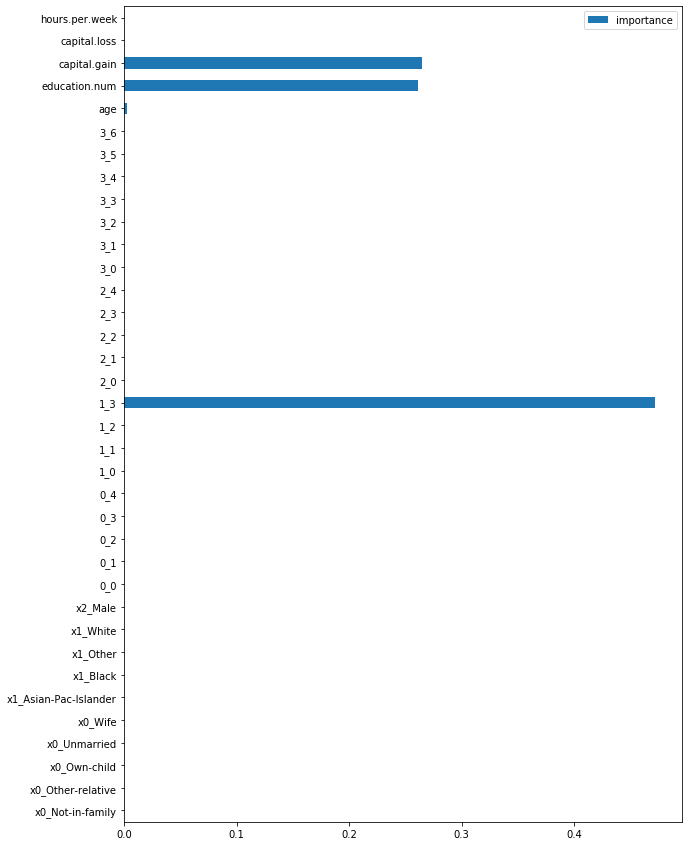

In [115]:
importance_table.plot(kind='barh', figsize=(10,15))

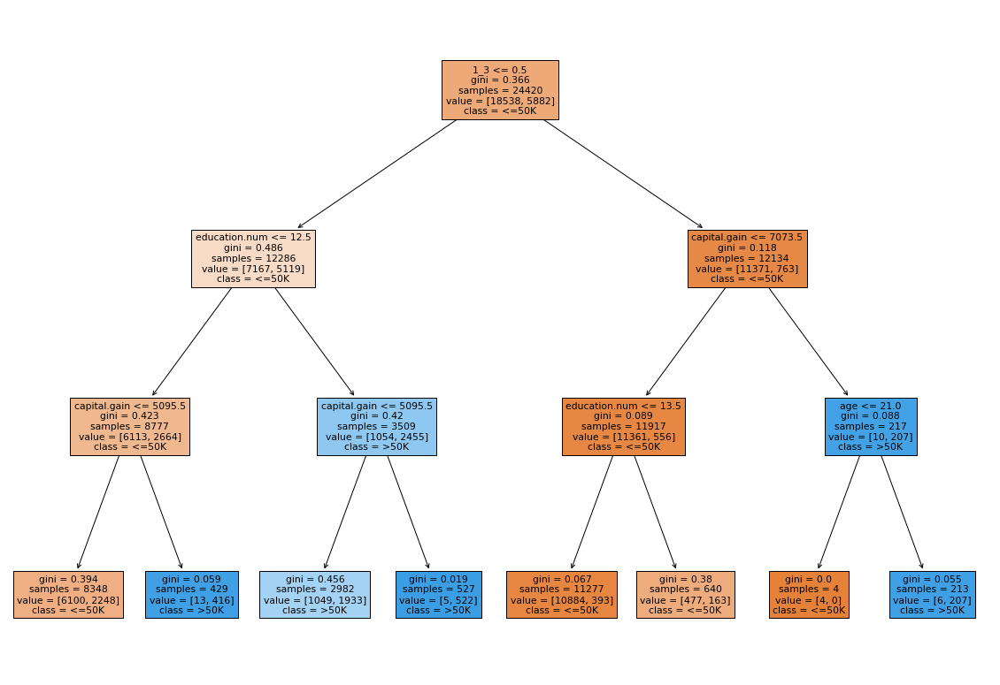

In [119]:
plt.figure(figsize=(20,14))
plot_tree(model, feature_names= features, filled=True, class_names=['<=50K','>50K'])
plt.show()

# Feature Selection
 
 - Univariate Statistics FS
 
    * seleksi berdasarkan nilai F-test untuk regresi, dan Log Likelihood Ratio untuk klasifikasi

 - Model Based FS

    * memililih fitur menggunakan model machine learning langsung
    * decisison tree/ tree model based bisa menggunakan feature importance.
    * model linear reg atau logistic reg bisa menggunakan niali absolut dari coefficient, dgn catatan fitur yg digunakan memiliki skala yg sama atau sudah dinormalisasi

 - Iterative FS

   * memilih feature dgn cara membangun serangkaian model dgn variasi fitur yg bermacam macam.
   * terbagi menjadi backward dan forward.
   * dlm metode backward, kita gunakan semua fitur, kemudian kita eliminasi satu per satu sampai kriteria terpenuhi.
   * dlm metode forward, kita menambahkan satu per satu fitur hingga kriteria terpenuhi.

# Table of Content

1. data transformation
2. feature selection: select percentile
3. model fiting and evaluation

## 1. data transformation

In [125]:
X_train_prep = transformer.fit_transform(X_train)
X_test_prep = transformer.transform(X_test)

In [129]:
select = SelectPercentile(percentile=50)
#  memilih feature berdasarkan percentile dari high score, score_func, default= f_classif
select.fit(X_train_prep, y_train)

SelectPercentile(percentile=50,
                 score_func=<function f_classif at 0x0000020C0B1AF3A8>)

In [131]:
X_train_prep_selected = select.transform(X_train_prep)
X_test_prep_selected = select.transform(X_test_prep)


In [134]:
X_train_prep_selected

array([[0.0000e+00, 0.0000e+00, 1.0000e+00, ..., 0.0000e+00, 0.0000e+00,
        1.0000e+01],
       [1.0000e+00, 0.0000e+00, 0.0000e+00, ..., 0.0000e+00, 0.0000e+00,
        5.5000e+01],
       [0.0000e+00, 0.0000e+00, 0.0000e+00, ..., 1.5024e+04, 0.0000e+00,
        5.0000e+01],
       ...,
       [0.0000e+00, 0.0000e+00, 1.0000e+00, ..., 0.0000e+00, 0.0000e+00,
        4.0000e+01],
       [0.0000e+00, 0.0000e+00, 0.0000e+00, ..., 0.0000e+00, 0.0000e+00,
        4.0000e+01],
       [0.0000e+00, 0.0000e+00, 0.0000e+00, ..., 0.0000e+00, 0.0000e+00,
        4.0000e+01]])

In [132]:
print('before selection:', X_train_prep.shape)
print('after selection:', X_train_prep_selected.shape)

# featurenya tinggal setengahnya (percentile=50)

before selection: (24420, 36)
after selection: (24420, 18)


In [136]:
# The selected features
mask = select.get_support()

mask

array([ True,  True,  True,  True,  True, False,  True, False,  True,
        True, False, False, False,  True, False, False,  True,  True,
        True, False, False, False, False,  True, False, False, False,
       False, False, False, False,  True,  True,  True,  True,  True])

In [135]:
selected_features = pd.DataFrame({
    'indicator':mask,
    'features':features
})

selected_features[selected_features['indicator']==True]

,indicator,features
0,True,x0_Not-in-family
1,True,x0_Other-relative
2,True,x0_Own-child
3,True,x0_Unmarried
4,True,x0_Wife
6,True,x1_Black
8,True,x1_White
9,True,x2_Male
13,True,0_3
16,True,1_1


## 2. Model Fitting and Eval

In [138]:
model = LogisticRegression(max_iter=1000, solver='liblinear', C=10)
model.fit(X_train_prep_selected, y_train)

print('score', model.score(X_test_prep_selected, y_test)) # cara lain melihat accuracy score

score 0.8395774474880235


In [141]:
model.coef_

array([-5.17084903e-01, -1.40108758e+00, -1.78343073e+00, -7.04674004e-01,
        1.18452882e+00, -2.86538027e-02,  1.84545969e-01,  6.82505969e-01,
       -1.06350422e-01, -3.10424768e-01,  3.87780491e-01, -1.11752191e+00,
       -1.79382959e-01,  2.30964926e-02,  3.60605264e-01,  3.17495942e-04,
        6.00110913e-04,  3.07372834e-02])

decision tree score: 0.835

logistic regression score : 0.838

## 3. Model Properties

In [143]:
coef_table = pd.DataFrame({
    'features':selected_features[selected_features['indicator']==True]['features'],
    'coef': model.coef_[0]
})

coef_table

,features,coef
0,x0_Not-in-family,-0.517085
1,x0_Other-relative,-1.401088
2,x0_Own-child,-1.783431
3,x0_Unmarried,-0.704674
4,x0_Wife,1.184529
6,x1_Black,-0.028654
8,x1_White,0.184546
9,x2_Male,0.682506
13,0_3,-0.106350
16,1_1,-0.310425
